# Squat Supervision Inference Pipeline

This notebook demonstrates an inference pipeline for analyzing squat form in a video using a combination of YOLO-based keypoint extraction and GPT-4 for intelligent feedback. By conducting this experiment, we can see how integrating Roboflow can enhance the capabilities of vision foundation models like GPT-4 for more accurate and data-informed video processing.

## Objective
The main objective is to compare the effectiveness of GPT-4’s inference capabilities with two approaches:
1. **Baseline Analysis**: Using visual data alone, GPT-4 will analyze squat form based on frame data extracted from a video.
2. **Enhanced Analysis with YOLO-based Angles**: GPT-4 will use the same visual frame data plus YOLO-calculated joint angles to provide a more data-informed assessment of squat form.

This experiment helps determine if adding YOLO-based angle calculations improves GPT-4’s ability to give actionable feedback on squat stability, depth, and alignment.

## Setup for Roboflow Inference and Supervision

This notebook requires:
- `supervision` and `inference` packages for model inference and processing.
- `openai` for GPT-4 integration.

P.S. This notebook was created in Google Colab, I recommend running it there to avoid dependency conflicts.

In [ ]:
!pip install supervision inference openai

We will download a sample video from drive, feel free to swap it with yours.

In [ ]:
!wget --no-check-certificate 'https://drive.google.com/uc?export=download&id=1if3TC6wvh6-ZCGXSbKMEQLI1PctzrKPn' -O squat_video.mp4

In [15]:
import cv2
import imageio
from IPython.display import Video, Image, display
import base64
from openai import OpenAI
import os
import json
from inference import InferencePipeline
from inference.core.interfaces.camera.entities import VideoFrame
from PIL import Image as pImg
import math
import numpy as np
import supervision as sv
import csv
import pandas as pd
import statistics
import matplotlib.pyplot as plt


## Convert Video to GIF for Visualization

In [16]:
def video_to_gif(video_path, gif_path='output.gif', frame_rate_divisor=5, fps=10):
    """
    Convert a video to a looping GIF and display it in a Jupyter notebook.

    Parameters:
    - video_path (str): Path to the video file.
    - gif_path (str): Path to save the output GIF file.
    - frame_rate_divisor (int): Process every nth frame to control the GIF frame rate.
    - fps (int): Frames per second for the GIF playback.
    """
    cap = cv2.VideoCapture(video_path)
    frames = []
    frame_count = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        if frame_count % frame_rate_divisor == 0:
            frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        frame_count += 1

    cap.release()
    imageio.mimsave(gif_path, frames, format='GIF', fps=fps, loop=0)
    display(Image(filename=gif_path))


## Show Our Sample Video

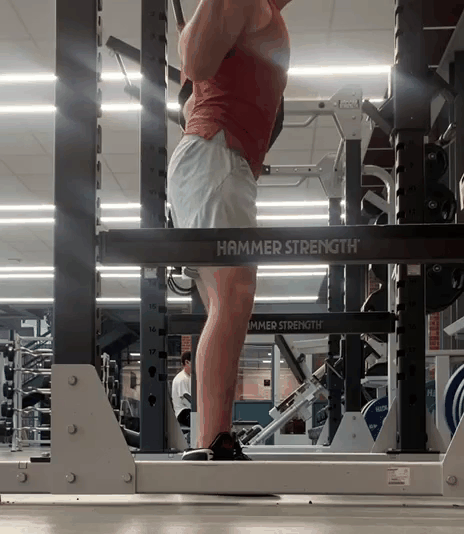

In [17]:
video_to_gif("squat_video.mp4", gif_path="squat_init.gif")

![Animation](squat_init.gif)


## Frame Extraction and Angle Calculation

The functions below extract frames from the video at set intervals and calculate joint angles for each frame. These angles, calculated using YOLO-detected keypoints, will be used to measure squat depth, stability, and alignment.

### Key Components:
- **Frame Extraction**: Captures every nth frame for analysis, avoiding redundant data.
- **Angle Calculation**: Computes angles between specific joint pairs to quantify squat form.

These angles serve as additional data points for GPT-4 in the enhanced analysis.


In [18]:
frames = []

KEYPOINT_PAIRS = [
    (5, 6),   # Left shoulder to right shoulder
    (5, 7),   # Left shoulder to left elbow
    (7, 9),   # Left elbow to left wrist
    (6, 8),   # Right shoulder to right elbow
    (8, 10),  # Right elbow to right wrist
    (11, 12), # Left hip to right hip
    (5, 11),  # Left shoulder to left hip
    (6, 12),  # Right shoulder to right hip
    (11, 13), # Left hip to left knee
    (13, 15), # Left knee to left ankle
    (12, 14), # Right hip to right knee
    (14, 16)  # Right knee to right ankle
]

## Define Functions for Angles Calculation

In [19]:
def calculate_angle(p1, p2, p3):
    """Calculate the angle between the line p1-p2 and p2-p3."""
    vector1 = (p1['x'] - p2['x'], p1['y'] - p2['y'])
    vector2 = (p3['x'] - p2['x'], p3['y'] - p2['y'])

    # Dot product and magnitude of vectors
    dot_product = vector1[0] * vector2[0] + vector1[1] * vector2[1]
    magnitude1 = math.sqrt(vector1[0] ** 2 + vector1[1] ** 2)
    magnitude2 = math.sqrt(vector2[0] ** 2 + vector2[1] ** 2)

    # Calculate angle in radians and convert to degrees
    angle_rad = math.acos(dot_product / (magnitude1 * magnitude2 + 1e-6))
    return math.degrees(angle_rad)

def calculate_torso_angle(shoulder, hip):
    """Calculate the torso angle relative to the vertical."""
    # Point vertically aligned with hip
    vertical_reference = {'x': hip['x'], 'y': hip['y'] - 1}
    return calculate_angle(vertical_reference, hip, shoulder)

def calculate_angles(data_point):
    """Extract relevant angles from pose detection data."""
    keypoints = {kp['class_name']: kp for kp in data_point['predictions'][0]['keypoints']}

    # Torso angle (back straightness)
    torso_angle = calculate_torso_angle(keypoints['right_shoulder'], keypoints['right_hip'])

    # Hip angle (left and right)
    left_hip_angle = calculate_angle(keypoints['left_shoulder'], keypoints['left_hip'], keypoints['left_knee'])
    right_hip_angle = calculate_angle(keypoints['right_shoulder'], keypoints['right_hip'], keypoints['right_knee'])

    # Knee angle (left and right)
    left_knee_angle = calculate_angle(keypoints['left_hip'], keypoints['left_knee'], keypoints['left_ankle'])
    right_knee_angle = calculate_angle(keypoints['right_hip'], keypoints['right_knee'], keypoints['right_ankle'])

    return {
        'torso_angle': torso_angle,
        'left_hip_angle': left_hip_angle,
        'right_hip_angle': right_hip_angle,
        'left_knee_angle': left_knee_angle,
        'right_knee_angle': right_knee_angle
    }

## Define Custom Sink Function for Each Frame Using Supervision

In [20]:
def my_custom_sink(predictions: dict, video_frame: VideoFrame):
    global frame_counter
    # Convert predictions to Supervision KeyPoints
    keypoints = sv.KeyPoints.from_inference(predictions)
    image = video_frame.image.copy()

    # Initialize Supervision edge annotator to draw skeleton
    edge_annotator = sv.EdgeAnnotator(color=sv.Color.ROBOFLOW, thickness=2, edges=KEYPOINT_PAIRS)

    # Annotate the skeleton
    annotated_image = edge_annotator.annotate(scene=image.copy(), key_points=keypoints)

    # Calculate angles and define positions for display
    angles = calculate_angles(predictions)

    keypoint_dict = {kp['class_name']: kp for kp in predictions["predictions"][0]["keypoints"]}
    angle_positions = {
        'torso_angle': (keypoint_dict['right_hip']['x'], keypoint_dict['right_hip']['y'] - 20) if 'right_hip' in keypoint_dict else (0, 0),
        'left_hip_angle': (keypoint_dict['left_hip']['x'], keypoint_dict['left_hip']['y']) if 'left_hip' in keypoint_dict else (0, 0),
        'right_hip_angle': (keypoint_dict['right_hip']['x'], keypoint_dict['right_hip']['y']) if 'right_hip' in keypoint_dict else (0, 0),
        'left_knee_angle': (keypoint_dict['left_knee']['x'], keypoint_dict['left_knee']['y']) if 'left_knee' in keypoint_dict else (0, 0),
        'right_knee_angle': (keypoint_dict['right_knee']['x'], keypoint_dict['right_knee']['y']) if 'right_knee' in keypoint_dict else (0, 0),
    }

    for angle_name, angle_value in angles.items():
        pos_x, pos_y = angle_positions[angle_name]
        if pos_x != 0 and pos_y != 0:
            cv2.putText(annotated_image, f"{angle_name.replace('_', ' ').capitalize()}: {angle_value:.1f}",
                        (int(pos_x) + 10, int(pos_y) - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    # Convert the annotated frame to RGB for display and save it to frames list
    display_image = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    pil_image = pImg.fromarray(display_image)
    frames.append(pil_image)

    with open(csv_file_path, mode='a', newline='') as file:
        writer = csv.writer(file)
        writer.writerow([frame_counter] + list(angles.values()))

    frame_counter += 1

## Running the Inference Pipeline with yolov8x-pose-640 and Saving Results with Joint Angles


In [ ]:
csv_file_path = "angles_per_frame.csv"
csv_headers = ['frame', 'torso_angle', 'left_hip_angle', 'right_hip_angle', 'left_knee_angle', 'right_knee_angle']
frame_counter = 0

with open(csv_file_path, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(csv_headers)

# Set up the InferencePipeline with the video input
# I am running it on CPU, but you can use GPU with inference-gpu
pipeline = InferencePipeline.init(
    model_id="yolov8x-pose-640",
    video_reference="squat_video.mp4",
    on_prediction=my_custom_sink,
)

pipeline.start()
pipeline.join()

output_video_path = "pose_estimation_with_angles_sv.mp4"
fps = 30
frame_size = (frames[0].width, frames[0].height)
fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(output_video_path, fourcc, fps, frame_size)
for frame in frames:
    frame_cv = cv2.cvtColor(np.array(frame), cv2.COLOR_RGB2BGR)
    out.write(frame_cv)
out.release()

## Visualize Angles Detection Results on the Video

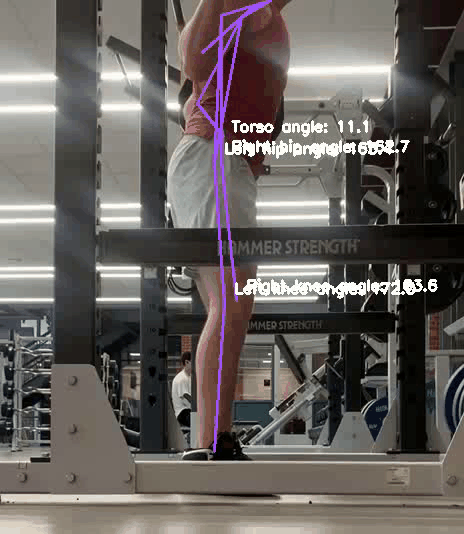

In [22]:
video_to_gif("pose_estimation_with_angles_sv.mp4", gif_path="pose_estimation_with_angles_sv.gif")

![Animation](pose_estimation_with_angles_sv.gif)


## Prompt Setup for GPT-4 Analysis

We set up two approaches for prompt generation:

1. **Baseline Prompt**: Uses only visual frames as input for GPT-4.
2. **Enhanced Prompt**: Combines visual frames with YOLO-calculated angle data for GPT-4, providing additional context on squat form.

Each prompt format is designed to see how well GPT-4 performs with and without empirical data on joint angles.


## Calculating Time Series and Summary Metrics for Joint Angles


In [23]:
def calculate_time_series(df):
    """Extract continuous time series data from each angle and round to 1 decimal place."""
    time_series_data = {
        "torso_angle_series": [round(angle, 1) for angle in df["torso_angle"]],
        "left_hip_angle_series": [round(angle, 1) for angle in df["left_hip_angle"]],
        "right_hip_angle_series": [round(angle, 1) for angle in df["right_hip_angle"]],
        "left_knee_angle_series": [round(angle, 1) for angle in df["left_knee_angle"]],
        "right_knee_angle_series": [round(angle, 1) for angle in df["right_knee_angle"]]
    }
    return time_series_data

def calculate_summary_metrics(angle_series):
    """Calculate min, max, average, standard deviation, and velocity for a given angle series."""
    min_val = min(angle_series)
    max_val = max(angle_series)
    avg_val = round(sum(angle_series) / len(angle_series), 1)
    std_dev = round(statistics.stdev(angle_series) if len(angle_series) > 1 else 0, 1)

    # Calculate velocity (average frame-to-frame change)
    velocity = round(sum(abs(angle_series[i+1] - angle_series[i]) for i in range(len(angle_series) - 1)) / (len(angle_series) - 1), 1)

    return {
        "min": min_val,
        "max": max_val,
        "avg": avg_val,
        "std_dev": std_dev,
        "velocity": velocity
    }

def calculate_metrics(df):
    """Calculate both time series and summary metrics for each angle."""
    time_series = calculate_time_series(df)

    summary_metrics = {
        "torso_angle_metrics": calculate_summary_metrics(time_series["torso_angle_series"]),
        "left_hip_angle_metrics": calculate_summary_metrics(time_series["left_hip_angle_series"]),
        "right_hip_angle_metrics": calculate_summary_metrics(time_series["right_hip_angle_series"]),
        "left_knee_angle_metrics": calculate_summary_metrics(time_series["left_knee_angle_series"]),
        "right_knee_angle_metrics": calculate_summary_metrics(time_series["right_knee_angle_series"])
    }

    results = {
        "time_series": time_series,
        "summary_metrics": summary_metrics
    }
    return results


## Inference Execution and Comparison



This function is for baseline analysis where GPT-4 is prompted to analyze squat form based on visual frames only, with no empirical angle data.

In [24]:
def create_baseline_prompt(frames):
    """Create a prompt for baseline analysis (frames only)."""
    prompt_messages = [
        {
            "role": "user",
            "content": [
                "These frames represent various points in a squat exercise. Analyze the squat form based solely on visual information from these frames. Provide advice on stability, depth, and alignment based on what you observe.",
                *map(lambda x: {"image": x}, frames)
            ],
        }
    ]
    return prompt_messages

In this function we run the enhanced analysis using both frame data and angle metrics. The additional data provides GPT-4 with a deeper context for squat form assessment.


In [25]:
def create_yolo_based_prompt(frames, results):
    """Create the enhanced prompt that uses both frames and angle data for GPT-4 analysis."""
    time_series_str = json.dumps(results["time_series"], indent=2)
    summary_metrics_str = json.dumps(results["summary_metrics"], indent=2)

    # YOLO-based prompt with detailed angle explanations
    yolo_prompt = f"""
Objective: Analyze squat performance based on angle metrics and provide constructive advice to improve form.

Data Explanation:
The angles provided reflect joint positions at each frame of a squat exercise. Here's how each angle is computed and what it signifies:
- Torso Angle: The angle between the torso (shoulder-to-hip line) and a vertical line originating from the hip. This angle shows the torso's alignment relative to the vertical axis, with lower values indicating more upright posture and larger values indicating forward lean.
- Hip Angles (Left and Right): The angle between the torso (shoulder-to-hip) and the upper leg (hip-to-knee). Smaller hip angles indicate greater squat depth. Symmetry between left and right hip angles reflects balanced mobility and stability in the hips.
- Knee Angles (Left and Right): The angle between the upper leg (hip-to-knee) and lower leg (knee-to-ankle). Smaller knee angles reflect deeper squats with more knee flexion. Symmetry and consistency in knee angles reflect balanced knee engagement and stability.

Data Provided:
1. Continuous Time Series (angle values captured per frame):
{time_series_str}

2. Cycle-Based Key Metrics:
{summary_metrics_str}

Instructions:
1. Analyze Stability and Control: Use the standard deviation and velocity metrics to assess consistency. Identify any rapid changes or high variation as signs of instability.
2. Evaluate Depth and Alignment:
   - Depth: Check minimum hip and knee angles; smaller angles reflect deeper squats. Ensure hip and knee angles are within proper ranges to avoid excessive stress.
   - Torso Alignment: Review torso angle to determine if there's excessive forward lean, which can strain the back.
3. Assess Symmetry: Compare left and right angles for hips and knees to detect asymmetry. Asymmetry could indicate balance or mobility issues.
4. Provide Advice: Offer constructive guidance based on any deviations from optimal squat form, using both angle data and general squat principles.

Response Format:
- Overall Assessment: Summarize key findings (e.g., stability, depth, alignment).
- Specific Advice: Provide targeted tips to improve squat form based on the data (e.g., exercises, posture cues).
- Recommendations for Symmetry: Address any asymmetry found in left vs. right angles.
"""

    prompt_messages = [
        {
            "role": "user",
            "content": [
                "These frames represent various points in a squat exercise. Analyze the squat form using both the visual information and the provided angle metrics.",
                *map(lambda x: {"image": x}, frames),
                yolo_prompt,
            ],
        }
    ]
    return prompt_messages



## Display and Save Results

After the inference, the outputs are saved as JSON files for baseline and enhanced analysis. These saved results allow for easy comparison between the two approaches, enabling us to evaluate the impact of adding YOLO-based joint angles on GPT-4’s squat feedback.


In [26]:
def extract_frames(video_path, frame_interval=1):
    """Extract every nth frame from a video."""
    video = cv2.VideoCapture(video_path)
    frames = []
    index = 0
    while video.isOpened():
        ret, frame = video.read()
        if not ret:
            break
        if index % frame_interval == 0:
            _, buffer = cv2.imencode(".jpg", frame)
            frames.append(base64.b64encode(buffer).decode("utf-8"))
        index += 1
    video.release()
    return frames

def save_output(file_name, content):
    """Save content to a file in JSON format."""
    with open(file_name, 'w') as f:
        json.dump(content, f, indent=4)

def visualize_frame(base64_frame):
    """Decode a base64 frame and display it."""
    frame_data = base64.b64decode(base64_frame)
    np_frame = np.frombuffer(frame_data, np.uint8)
    frame = cv2.imdecode(np_frame, cv2.IMREAD_COLOR)
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    plt.imshow(frame_rgb)
    plt.axis('off')
    plt.show()

Load in the angles data, calculate metrics and visualize the first frame to make sure we process the correct data.

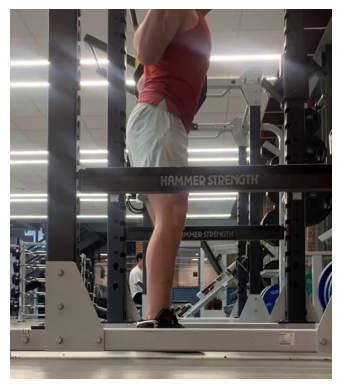

In [27]:
df = pd.read_csv("angles_per_frame.csv")
# Calculate metrics from the data
results = calculate_metrics(df)

video_path = "squat_video.mp4"
frame_interval = 1
frames = extract_frames(video_path, frame_interval)

if frames:
    visualize_frame(frames[0])
else:
    print("No frames were extracted.")

If we visualize angle time series over frames we can see that they all display a cyclic trend, representing an exercise repetition.

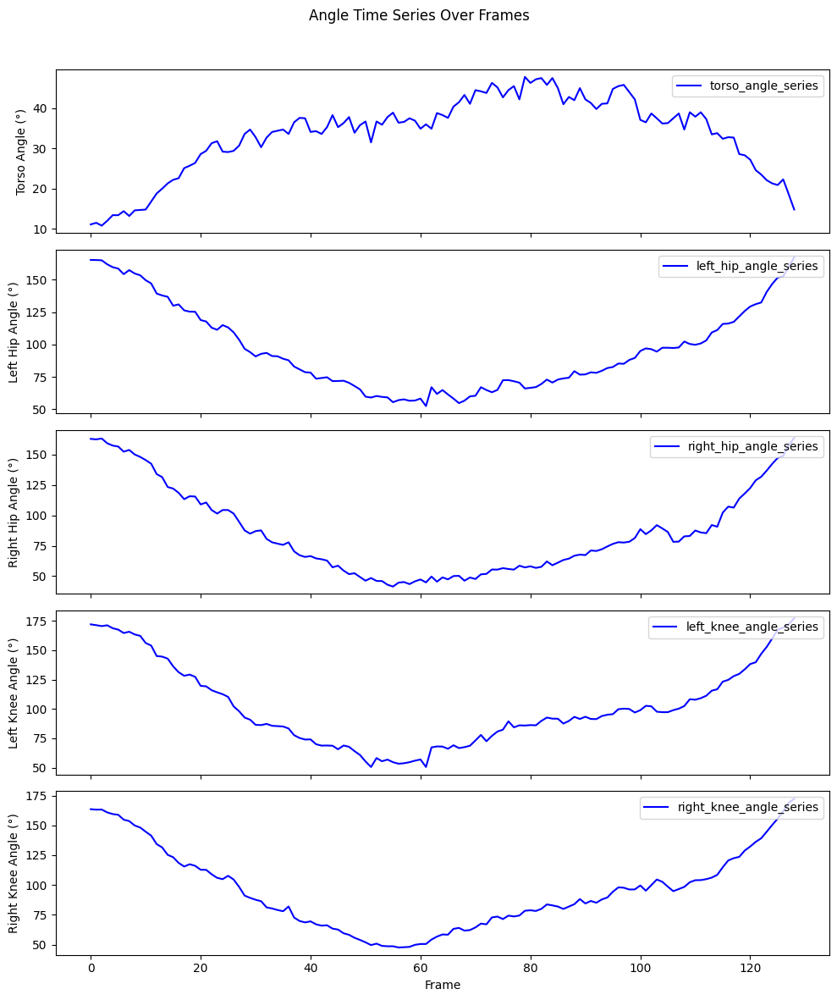

In [28]:
import matplotlib.pyplot as plt

time_series_data = results["time_series"]
fig, axes = plt.subplots(len(time_series_data), 1, figsize=(10, 12), sharex=True)
fig.suptitle("Angle Time Series Over Frames")

if len(time_series_data) == 1:
    axes = [axes]

for i, (angle_name, angle_values) in enumerate(time_series_data.items()):
    axes[i].plot(df['frame'], angle_values, label=angle_name, color="blue")
    axes[i].set_ylabel(f"{angle_name.replace('_series', '').replace('_', ' ').title()} (°)")
    axes[i].legend(loc="upper right")

axes[-1].set_xlabel("Frame")
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


The predictions are not fully stable so the graphs are jittery. Some smoothing in the future could be helpful here.

# GPT 4o Fitness Advice Generation
## Connect to OpenAI
## You need to insert your API key here. **!!This step requires actual spending of API credits so be aware of the costs!!**

In [29]:
client = OpenAI(api_key="")

### Running Baseline Analysis

In [30]:
baseline_prompt = create_baseline_prompt(frames)
baseline_response = client.chat.completions.create(
    model="gpt-4o",
    messages=baseline_prompt,
    max_tokens=600,
    temperature=0.3
)

baseline_output = baseline_response.choices[0].message.content
save_output("baseline_analysis_output.json", baseline_output)
print("Baseline Analysis (Frames Only):\n", baseline_output)

Baseline Analysis (Frames Only):
 Based on the frames provided, here are some observations and advice regarding squat form:

1. **Stability**:
   - Ensure the feet are shoulder-width apart and firmly planted on the ground.
   - Keep the weight evenly distributed across the entire foot, avoiding excessive pressure on the toes or heels.

2. **Depth**:
   - Aim for a squat depth where the thighs are at least parallel to the ground. In the frames, the depth appears to be adequate, but ensure that the hips are slightly below the knees for a full range of motion.

3. **Alignment**:
   - Maintain a neutral spine throughout the movement. Avoid rounding or excessive arching of the back.
   - Keep the chest up and the shoulders back to prevent leaning too far forward.
   - Ensure the knees track over the toes and do not cave inward.

4. **Additional Tips**:
   - Engage the core to support the lower back.
   - Keep the head in a neutral position, looking forward or slightly up.
   - Use a control

### Running Enhanced Analysis

In [33]:
enhanced_prompt = create_yolo_based_prompt(frames, results)
enhanced_response = client.chat.completions.create(
    model="gpt-4o",
    messages=enhanced_prompt,
    max_tokens=600,
    temperature=0.3
)

enhanced_output = enhanced_response.choices[0].message.content
save_output("enhanced_analysis_output.json", enhanced_output)
print("Baseline Analysis (Frames and Joint Angles):\n", enhanced_output)

Baseline Analysis (Frames and Joint Angles):
 ### Overall Assessment

1. **Stability and Control**: 
   - The standard deviation for all angles is relatively high, indicating some inconsistency in movement. The velocities suggest moderate control but could be improved for smoother execution.

2. **Depth and Alignment**:
   - **Depth**: The minimum hip angles (52.4° left, 41.5° right) and knee angles (50.5° left, 47.6° right) indicate a deep squat, which is generally good for full range of motion. However, ensure this depth does not compromise form or cause discomfort.
   - **Torso Alignment**: The torso angle ranges from 10.8° to 47.8°, with an average of 33.6°. This suggests a forward lean, which is common in squats but should be monitored to prevent excessive strain on the back.

3. **Symmetry**:
   - There is noticeable asymmetry between the left and right hip and knee angles, with the right side generally showing smaller angles, indicating potential imbalance or mobility issues.

#

## Conclusion
Combining YOLO-derived joint angles with GPT-4's visual frame analysis improves the specificity and consistency of feedback on squat form. With angle data, GPT-4 can more accurately identify issues like depth, symmetry, and alignment, offering more actionable advice. Overall, YOLO + GPT-4 provides a clearer, data-informed basis for form improvement than visual analysis alone. There are some misses in terms of angles, like the right and left knee angles not being equal, due to sideways detection, but all of those could be fixed with a more precise and calibrated setup.